In [1]:
import torch
import numpy as np
from dptb.plugins.init_nnsk import InitSKModel
from dptb.nnops.NN2HRK import NN2HRK
from dptb.nnops.apihost import NNSKHost 
from ase.io import read,write
from dptb.structure.structure import BaseStruct
import matplotlib.pyplot as plt
from dptb.postprocess.bandstructure.band import bandcalc
import pickle as pickle
#"seed": 3982377700,
from dptb.postprocess.bandstructure.dos import doscalc, pdoscalc
from dptb.utils.make_kpoints import rot_revlatt_2D, kmesh_fs
from dptb.postprocess.bandstructure.ifermi_api import ifermiapi
from ifermi.plot import FermiSurfacePlotter


In [2]:
from ifermi.interpolate import FourierInterpolator
from ifermi.kpoints import kpoints_from_bandstructure
from ifermi.surface import FermiSurface
from ifermi.plot import FermiSurfacePlotter
from ifermi.plot import show_plot, save_plot
from pymatgen.electronic_structure.core import Spin
from ifermi.plot import FermiSlicePlotter


In [3]:
checkfile = './ckpt/2-2-2_best_nnsk_b5.000_c5.000_w0.100.pth'
#checkfile = "./inputSiGe.json"
f = torch.load(checkfile)
nnskapi = NNSKHost(checkpoint=checkfile)
nnskapi.register_plugin(InitSKModel())
nnskapi.build()
nnHrk = NN2HRK(apihost=nnskapi, mode='nnsk')

# initial rotate H or S func.


In [4]:
run_opt={"structure":"./data/silicon.vasp",
        "results_path":"./"}
    
jdata={
        "fermisurface":{
            "mesh_grid":[8,8,8],
            "mu":-2,
            "sigma":0.05,
            "intpfactor":3,
            "wigner_seitz":True,
            "nworkers":4,
            "plot_type":"matplotlib",
            "use_gui": False,
            "plot_fs_bands":True,
            "fs_plane":[0,0,1],
            "fs_distance":0.0,
            "plot_options":{
                "_comment": "additional plot options, like colors, azimuth, elevation etc. see ifermi.plot.FermiSurfacePlotter for more details"
            }
        },
        "property":{
            "velocity":True,
            "colormap":"RdBu",
            "plot_prop_bands":False,
            "plot_options":{
                "_comment": "additional plot options, like colors, azimuth, elevation etc. see ifermi.plot.FermiSurfacePlotter for more details",
                "projection_axis": None
            }
        }
}


In [5]:
ifermi = ifermiapi(apiHrk=nnHrk,run_opt=run_opt,jdata=jdata)

In [6]:
_, kpoints = kmesh_fs(meshgrid= [8,8,8])
eigenvalues, E_fermi = ifermi.get_eigenvalues(kpoints= kpoints)

In [7]:
bs = ifermi.get_band_structure()

In [8]:
fs = ifermi.get_fs(bs)

In [9]:
fs.has_properties

True

In [10]:
plotter = FermiSurfacePlotter(fs)

In [12]:
plotter.get_plot(color_properties=False,plot_type='plotly')

In [13]:
plot = plotter.get_plot(
    vector_properties="RdBu",
    plot_type="plotly",
    projection_axis=(0, 0, 1),
    hide_surface=False,
    hide_labels=True
)
plot.show()

In [20]:
#interpolator = FourierInterpolator(bs) 

In [14]:
fermi_slice = fs.get_fermi_slice(plane_normal=(0, 0, 1), distance=0)


In [15]:
slice_plotter = FermiSlicePlotter(fermi_slice)


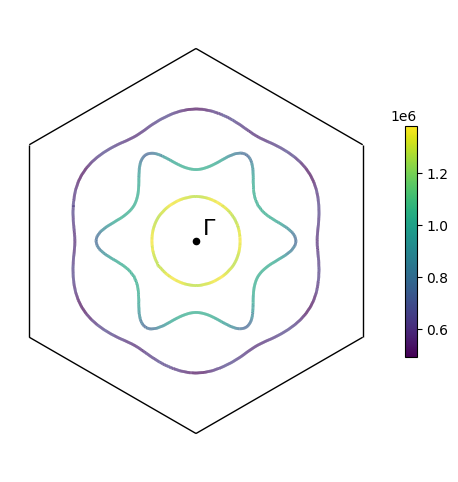

In [16]:
plot = slice_plotter.get_plot()
plot.show()
